In [ ]:
!git clone https://github.com/fenago/cv2

Cloning into 'cv2'...
remote: Enumerating objects: 219, done.
remote: Counting objects: 100% (70/70), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 219 (delta 21), reused 6 (delta 6), pack-reused 149 (from 1)
Receiving objects: 100% (219/219), 98.84 MiB | 24.05 MiB/s, done.
Resolving deltas: 100% (35/35), done.
Updating files: 100% (147/147), done.


<h1 style="font-size:30px;">Convolution and Image Filtering</h1>

In image processing, convolution is the basis of all linear filters. It is the very first step applied when we want to blur, sharpen or detect edges. And yes, it is the same convolution used in state-of-the-art neural networks. In this notebook, you will learn the concept behind convolution, the OpenCV function to implement convolution, and different types of filters.
<br>
<center>
<img src="https://opencv.org/wp-content/uploads/2021/09/c0-m8-feature-image.png" alt="c0-m8-feature-image.png">
</center>
<br>
<center>
<img src="https://opencv.org/wp-content/uploads/2021/09/c0-m8-convolution.png" alt="c0-m8-convolution.png">
</center>
<br>

### <font style = "color:rgb(50,120,229)">Convolution</font>
A convolution operation requires two inputs, the **input image** and a **kernel**. The input image can be either grayscale or color. For color images, convolution is performed independently on each channel. A convolution kernel is a 2D matrix that is used to filter images, also known as a **convolution matrix**. It is typically a square, MxN matrix, where both M and N are odd integers (e.g., 3×3, 5×5, 7×7, ...). The 3x3 kernel below is referd to as a Box kernel.

$$\frac{1}{9}\begin{bmatrix} 1 & 1 & 1 \\ 1 & 1 & 1 \\ 1 & 1 & 1 \end{bmatrix}$$

In most cases, we want the sum of the elements in a kernel to sum to one. This ensures that the output image has the same brightness level as the input image. If we do not do this, the output pixels will be approximately 9 times (3x3 = 9) brighter than the input pixels on average. There are no restrictions on entries of the kernel. They can be positive, negative, integers or floating-point numbers.

The output is a **filtered** image. Filtering of a source image is achieved by convolving the kernel with the image. In simple terms, convolution of an image with a kernel represents a simple mathematical operation, between the kernel and its corresponding elements in the image.

### <font style = "color:rgb(50,120,229)">Convolution Workflow</font>

 - Assume that the center of the kernel is positioned over a specific pixel (`p`), in an image.
 - Multiply the value of each element in the kernel with the corresponding pixel element (i.e., its pixel intensity) in the source image.
 - Add the result of those multiplications and compute the average.
 - Replace the value of pixel (`p`), with the calculated average value.


### **<font style = "color:rgb(50,120,229)">Note:</font>**

The convolution filtering described above is actually called correlation filtering. Correlation and convolution are exactly the same operation with one difference. In convolution, the kernel is rotated 180 degrees before doing the correlation operation. When the kernel is symmetric, correlation and convolution are the same.

## 1.1 Define a Kernel

First, we need to define a kernel. For this exercise, let’s use a kernel size of 5x5. To keep things simple, we will also choose a kernel where all elements are the same. This kernel is often called a **Box Kernel**. Notice that when a kernel is written in matrix form as shown below we often pre-multiply the matrix by a normalizing factor (in this case 1/25). This makes it a little easier to read and understand the kernel.

$$\frac{1}{25}\begin{bmatrix} 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1\end{bmatrix}$$


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
kernel_size = 5
# Create a 5*5 kernel with all elements equal to 1.
kernel = np.ones((kernel_size, kernel_size), dtype = np.float32) / kernel_size**2

print (kernel)

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


Next, `filter2D()` is used to perform the convolution.

The second parameter (`ddepth`) is set to `-1`, which means the bit-depth of the output image is the same as the input image. So if the input image is of type `uint8`, the output image will also be of the same type.

# 1. Convolution in OpenCV

In OpenCV, convolution is performed using the function **`filter2D()`**

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font style = "color:rgb(8,133,37)">Function Syntax</font>

```python
dst = cv2.filter2D(src, ddepth, kernel[, dst[, anchor[, delta[, borderType]]]])
```

**`dst`**	output image of the same size and the same number of channels as src.

The function has **3 required input arguments**:

1. **`src`**	input image.
2. **`ddepth`**	desired depth of the destination image.
3. **`kernel`**	convolution kernel (or rather a correlation kernel), a single-channel floating point matrix; if you want to apply different kernels to different channels, split the image into separate color planes using split and process them individually.

Optional arguments:

1. **`anchor`**	anchor of the kernel that indicates the relative position of a filtered point within the kernel; the anchor should lie within the kernel; default value (-1, -1) means that the anchor is at the kernel center.
2. **`delta`**	optional value added to the filtered pixels before storing them in dst.
3. **`borderType`**	pixel extrapolation method.

**Note**: The optional parameters above are almost never changed from their default values.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`filter2d()`**](https://docs.opencv.org/4.5.2/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04)


<hr style="border:none; height: 4px; background-color:#D3D3D3" />

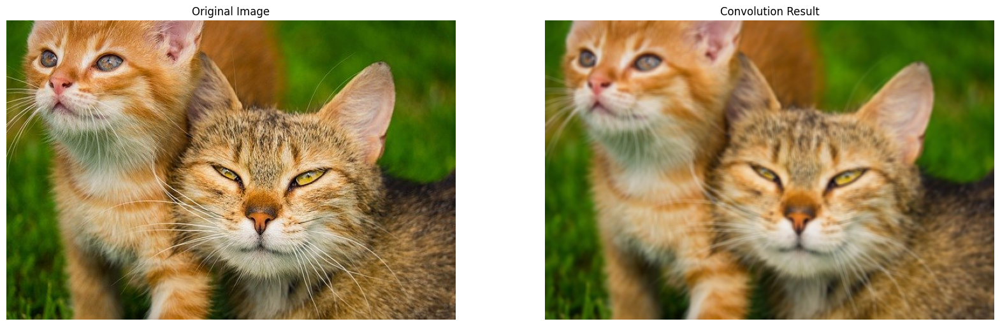

In [ ]:
filename = '/content/cv2/Mod8/kitten.jpg'
image = cv2.imread(filename)

dst = cv2.filter2D(image, ddepth = -1, kernel = kernel)

plt.figure(figsize = [20,10])
plt.subplot(121); plt.axis('off'); plt.imshow(image[:,:,::-1]); plt.title("Original Image")
plt.subplot(122); plt.axis('off'); plt.imshow(dst[:,:,::-1]);   plt.title("Convolution Result");

Next, `filter2D()` is used to perform the convolution.

The second parameter (`ddepth`) is set to `-1`, which means the bit-depth of the output image is the same as the input image. So if the input image is of type `uint8`, the output image will also be of the same type.

# 2. Box Blur

In the previous example, we saw how to create a smoothing filter by convolving the image with a 5x5 kernel. The 3x3 version of that kernel looks like this.

$$
\frac{1}{9}
\begin{bmatrix}
1 & 1 & 1\\
1 & 1 & 1\\
1 & 1 & 1
\end{bmatrix}
$$

The box kernel weights the contribution of all pixels in the neighborhood equally. As shown in the previous example, we can create this kernel and apply it to this image using `filter2D()`. Since this is a frequently used operation, OpenCV provides a convenience function for performing this operation (`blur()`)

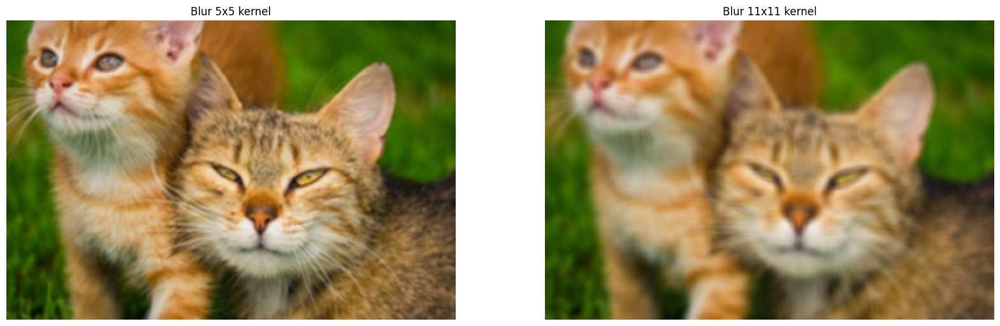

In [ ]:
# Apply a box filter - kernel size 5.
box_blur1 = cv2.blur(image, (5,5))

# Apply a box filter - kernel size 11.
box_blur2 = cv2.blur(image, (11,11))

# Display.
plt.figure(figsize = (20, 10))
plt.subplot(121); plt.axis('off'); plt.imshow(box_blur1[:,:,::-1]); plt.title('Blur 5x5 kernel')
plt.subplot(122); plt.axis('off'); plt.imshow(box_blur2[:,:,::-1]); plt.title('Blur 11x11 kernel');

# 3. Gaussian Blur

Unlike the box kernel, the Gaussian kernel is not uniform. The middle pixel gets the maximum weight while the pixels farther away are given less weight. A Gaussian Blur kernel weights the contribution of a neighboring pixel based on a Gaussian distribution. The Gaussian 5x5 kernel shown below is an approximation to the 2D Gaussian distribution with ${\sigma}=1$. A large value of ${\sigma}$ would add more weight to the edges of the kernel and therefore have a stronger blurring effect, while a smaller value of ${\sigma}$ would narrow the blurring effect. The size of the kernel also determines the amount of blurring. A larger kernel (with the same value of sigma) will blur the image more than a smaller kernel.

<br>
<center>
<img src="https://opencv.org/wp-content/uploads/2021/09/c0-m8-01-gaussian-kernel-distribution.png" alt="c0-m8-01-gaussian-kernel-distribution.png">
</center>
<br>

An image blurred using the Gaussian kernel looks less blurry compared to a box kernel of the same size. A small amount of Gaussian blurring is frequently used to remove noise from an image. It is also applied to the image prior to noise-sensitive image filtering operations. For example, the Sobel kernel used for calculating the derivative of an image is a combination of a Gaussian kernel and a finite difference kernel.

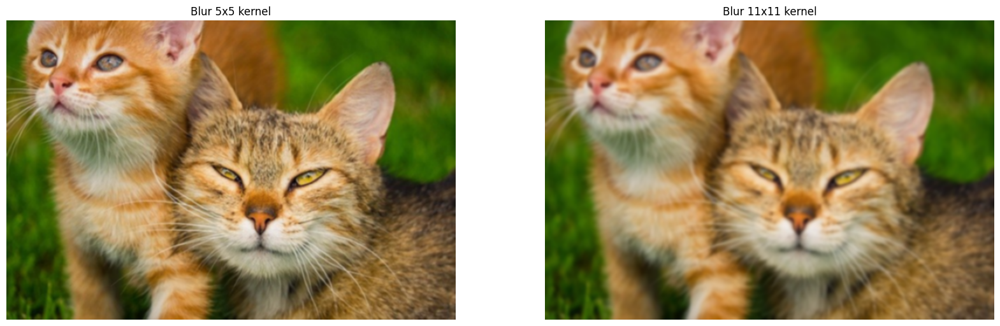

In [ ]:
# Apply Gaussian blur.
gaussian_blur1 = cv2.GaussianBlur(image, (5,5), 0, 0)
gaussian_blur2 = cv2.GaussianBlur(image, (11,11), 0, 0)

# Display.
plt.figure(figsize = (20, 8))
plt.subplot(121); plt.axis('off'); plt.imshow(gaussian_blur1[:,:,::-1]); plt.title('Blur 5x5 kernel')
plt.subplot(122); plt.axis('off'); plt.imshow(gaussian_blur2[:,:,::-1]); plt.title('Blur 11x11 kernel');

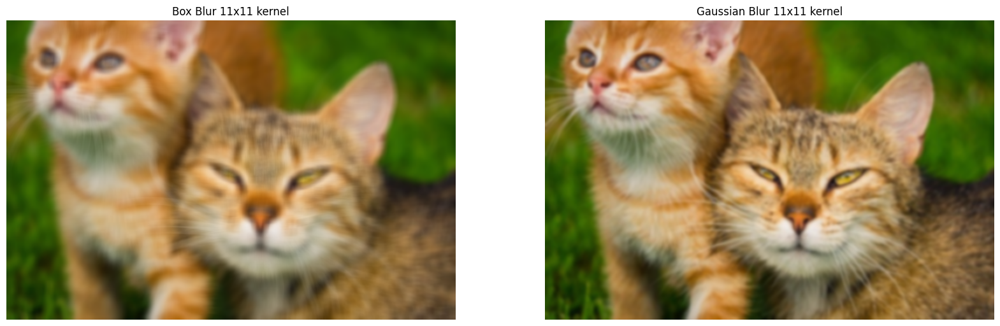

In [ ]:
plt.figure(figsize = (20, 8))
plt.subplot(121); plt.axis('off'); plt.imshow(box_blur2[:,:,::-1]);      plt.title('Box Blur 11x11 kernel')
plt.subplot(122); plt.axis('off'); plt.imshow(gaussian_blur2[:,:,::-1]); plt.title('Gaussian Blur 11x11 kernel');

## 3.1 Gaussian Blur in OpenCV

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font style = "color:rgb(8,133,37)">Function Syntax</font>

```python
dst = cv2.GaussianBlur(src, ksize, sigmaX[, dst[, sigmaY[, borderType]]])
```

**`dst`**	output image of the same size and type as src.

The function has **3 required input arguments**:

1. **`src`**	input image; the image can have any number of channels, which are processed independently, but the depth should be CV_8U, CV_16U, CV_16S, CV_32F or CV_64F.
2. **`ksize`**	Gaussian kernel size. ksize.width and ksize.height can differ but they both must be positive and odd. Or, they can be zero's and then they are computed from sigma.
3. **`sigmaX`**	Gaussian kernel standard deviation in X direction.

Optional arguments include:

- **`sigmaY`**	Gaussian kernel standard deviation in Y direction; if sigmaY is zero, it is set to be equal to sigmaX, if both sigmas are zeros, they are computed from ksize.width and ksize.height, respectively; to fully control the result regardless of possible future modifications of all these semantics, it is recommended to specify all of ksize, sigmaX, and sigmaY.
- **`borderType`**	pixel extrapolation method.

$$Sigma = 0.3 * ((ksize - 1) * 0.5-1) + 0.8$$

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`GaussianBlur()`**](https://docs.opencv.org/4.5.2/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

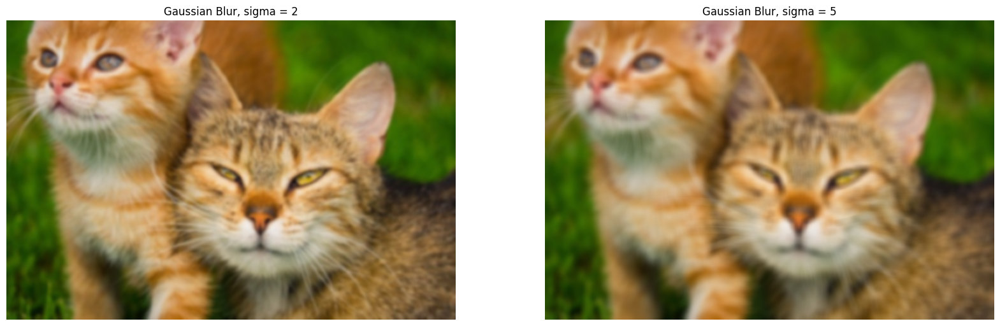

In [ ]:
# Specifying sigmax = 0 and sigmay = 0, will compute a sigma of 2 for a 11x11 kernal
gaussian_blur3 = cv2.GaussianBlur(image, (11,11), 0, 0)
# Here we are explicity setting the sigma values to be very large.
gaussian_blur4 = cv2.GaussianBlur(image, (11,11), 5, 5)

# Display.
plt.figure(figsize = (20, 8))
plt.subplot(121); plt.axis('off'); plt.imshow(gaussian_blur3[:,:,::-1]); plt.title('Gaussian Blur, sigma = 2')
plt.subplot(122); plt.axis('off'); plt.imshow(gaussian_blur4[:,:,::-1]); plt.title('Gaussian Blur, sigma = 5');

# 4. Image Sharpening

We can sharpen an image with the following 2D-convolution kernel.

$$
\begin{bmatrix}
0 & -1 & 0\\
-1 & 5 & -1\\
0 & -1 & 0
\end{bmatrix}
$$


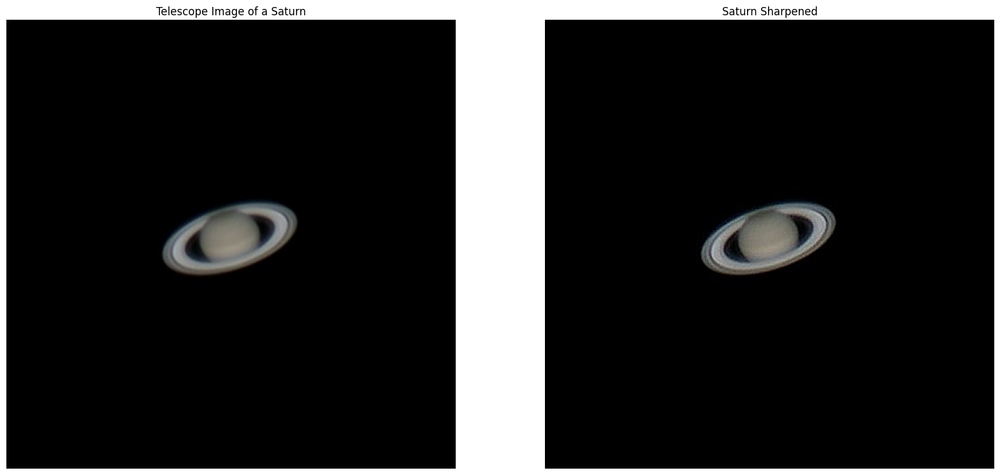

In [ ]:
saturn = cv2.imread('/content/cv2/Mod8/saturn.jpg')

# Define a sharpening kernel.
kernel = np.array([[ 0, -1,  0],
                   [-1,  5, -1],
                   [ 0, -1,  0]])

saturn_sharp = cv2.filter2D(saturn, ddepth = -1, kernel = kernel)

plt.figure(figsize = (20, 15))
plt.subplot(121); plt.axis('off'); plt.imshow(saturn[:,:,::-1]);       plt.title('Telescope Image of a Saturn')
plt.subplot(122); plt.axis('off'); plt.imshow(saturn_sharp[:,:,::-1]); plt.title('Saturn Sharpened');

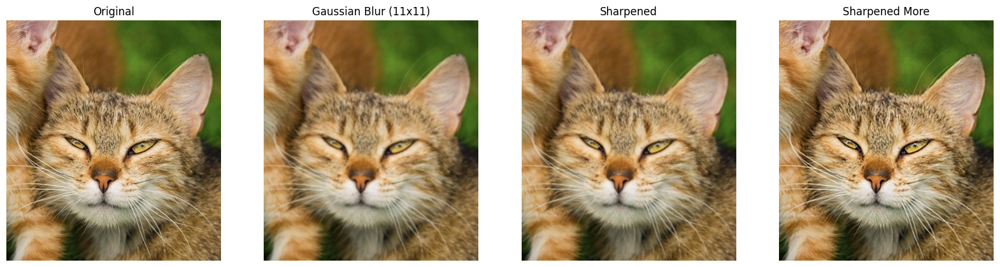

In [ ]:
image = cv2.imread('/content/cv2/Mod8/kitten_zoom.png')

gaussian_blur = cv2.GaussianBlur(image, (11,11), 0, 0)

# Sharpening kernel.
kernel1 = np.array([[ 0, -1,  0],
                   [-1,  5, -1],
                   [ 0, -1,  0]])

# More extreme sharpening kernel.
kernel2 = np.array([[0,  -4,  0],
                   [-4,  17, -4],
                   [ 0,  -4,  0]])

# Apply sharpening.
image_sharp1 = cv2.filter2D(gaussian_blur, ddepth = -1, kernel = kernel1)
image_sharp2 = cv2.filter2D(gaussian_blur, ddepth = -1, kernel = kernel2)

# Display.
plt.figure(figsize = (20,10))
plt.subplot(141); plt.axis('off'); plt.imshow(image[:,:,::-1]);         plt.title('Original')
plt.subplot(142); plt.axis('off'); plt.imshow(gaussian_blur[:,:,::-1]); plt.title('Gaussian Blur (11x11)')
plt.subplot(143); plt.axis('off'); plt.imshow(image_sharp1[:,:,::-1]);  plt.title('Sharpened')
plt.subplot(144); plt.axis('off'); plt.imshow(image_sharp2[:,:,::-1]);  plt.title('Sharpened More');

# Edge detection filters

<h1 style="font-size:30px;">Edge Detection</h1>

Edge detection is an image-processing technique used to identify the boundaries (edges) of objects, or regions within an image. Edges are among the most important features associated with images. We come to know of the underlying structure of an image through its edges. Computer vision processing pipelines therefore extensively use edge detection in applications. In this notebook, we will explore how convolution is used to detect edges and will cover the following edge detection methods.

* Sobel Edge Detection
* Canny Edge Detection

<br>
<center>
<img src="https://opencv.org/wp-content/uploads/2021/09/c0-m8-02-feature-image.png" alt="c0-m8-02-feature-image.png">
</center>
<br>

Edge detection is applied to grayscale images that are also often blurred prior to performing edge detection. Blurring is performed to reduce the noise in the image. In edge detection, numerical derivatives of the pixel intensities are computed, and this typically results in ‘noisy’ edges. In other words, the intensity of neighboring pixels in an image (especially near edges) can fluctuate quite a bit, giving rise to edges that don’t represent the predominant edge structure we are typically looking for. Blurring smooths the intensity variation near the edges, making it easier to identify the edge structure within the image.

# 1. Sobel Edge Detection using filter2D()

Sobel Edge Detection is one of the most widely used algorithms for edge detection. The Sobel Operator detects edges that are marked by sudden changes in pixel intensity. A sudden change in the derivative of intensity function will reveal a change in the pixel intensity as well. With this in mind, we can approximate the derivative, using a 3×3 kernel. We use one kernel to detect sudden changes in pixel intensity in the X direction, and another in the Y direction.

* X-direction Kernel : $$\begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}$$

* Y-direction Kernel : $$\begin{bmatrix} 1 & 2 & 1 \\ 0 & 0 & 0 \\ -1 & -2 & -1 \end{bmatrix}$$

When these kernels are convolved with the original image, you get a ‘Sobel edge image’.

 * If we use only the Vertical Kernel, the convolution yields a Sobel image, with edges enhanced in the X-direction
 * Using the Horizontal Kernel yields a Sobel image, with edges enhanced in the Y-direction.


## 1.1 Convolution Example
<br>
<center>
<img src="https://opencv.org/wp-content/uploads/2021/09/c0-m8-02-sobel-edge-detection-a.png" alt="c0-m8-02-sobel-edge-detection-a.png">
</center>
<br>

<center>
<img src="https://opencv.org/wp-content/uploads/2021/09/c0-m8-02-sobel-edge-detection-b.png" alt="c0-m8-02-sobel-edge-detection-b.png">
</center>
<br>

(800, 800, 3)


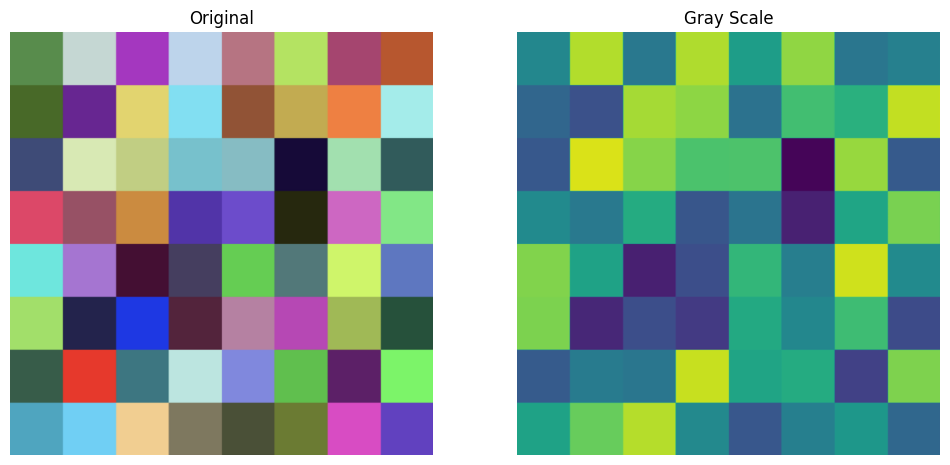

In [ ]:
# Read image.
img = cv2.imread('/content/cv2/Mod8/checkerboard_color.png')
# Convert to grayscale.
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

print(img.shape)

plt.figure(figsize = (12, 8))
plt.subplot(121); plt.axis('off'); plt.imshow(img[:,:,::-1]); plt.title('Original')
plt.subplot(122); plt.axis('off'); plt.imshow(img_gray);      plt.title('Gray Scale');

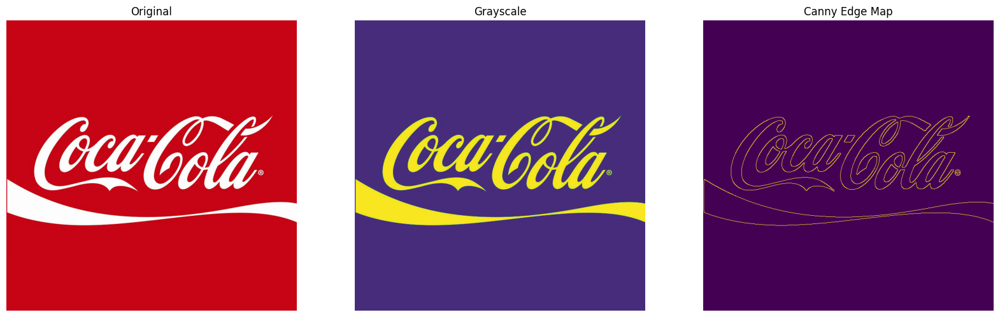

In [ ]:
img = cv2.imread('/content/cv2/Mod8/coca-cola-logo.png')

# Convert to grayscale.
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(img_gray, threshold1 = 180, threshold2 = 200)

plt.figure(figsize = (20,10))
plt.subplot(131); plt.axis("off"); plt.imshow(img[:,:,::-1]); plt.title('Original')
plt.subplot(132); plt.axis("off"); plt.imshow(img_gray);      plt.title('Grayscale')
plt.subplot(133); plt.axis("off"); plt.imshow(edges);         plt.title('Canny Edge Map');

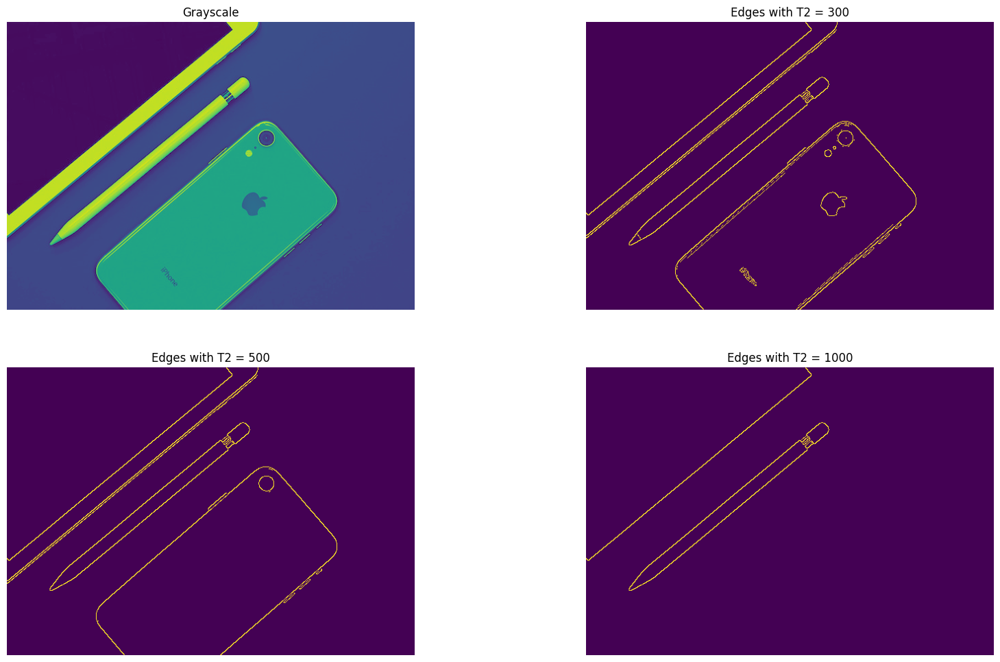

In [ ]:
img = cv2.imread('/content/cv2/Mod8/phone_ipad.jpg')

# Convert to grayscale.
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

edges1 = cv2.Canny(img_gray, threshold1 = 200, threshold2 = 300)
edges2 = cv2.Canny(img_gray, threshold1 = 200, threshold2 = 500)
edges3 = cv2.Canny(img_gray, threshold1 = 200, threshold2 = 1000)

plt.figure(figsize = (20,12))
plt.subplot(221); plt.axis("off"); plt.imshow(img_gray);  plt.title('Grayscale')
plt.subplot(222); plt.axis("off"); plt.imshow(edges1);    plt.title('Edges with T2 = 300')
plt.subplot(223); plt.axis("off"); plt.imshow(edges2);    plt.title('Edges with T2 = 500')
plt.subplot(224); plt.axis("off"); plt.imshow(edges3);    plt.title('Edges with T2 = 1000');

In [ ]:
# Read image.
img1 = cv2.imread('/content/cv2/Mod8/butterfly.jpg')
img2 = cv2.imread('/content/cv2/Mod8/Large_Scaled_Forest_Lizard.jpg')

# Convert to gray scale.
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

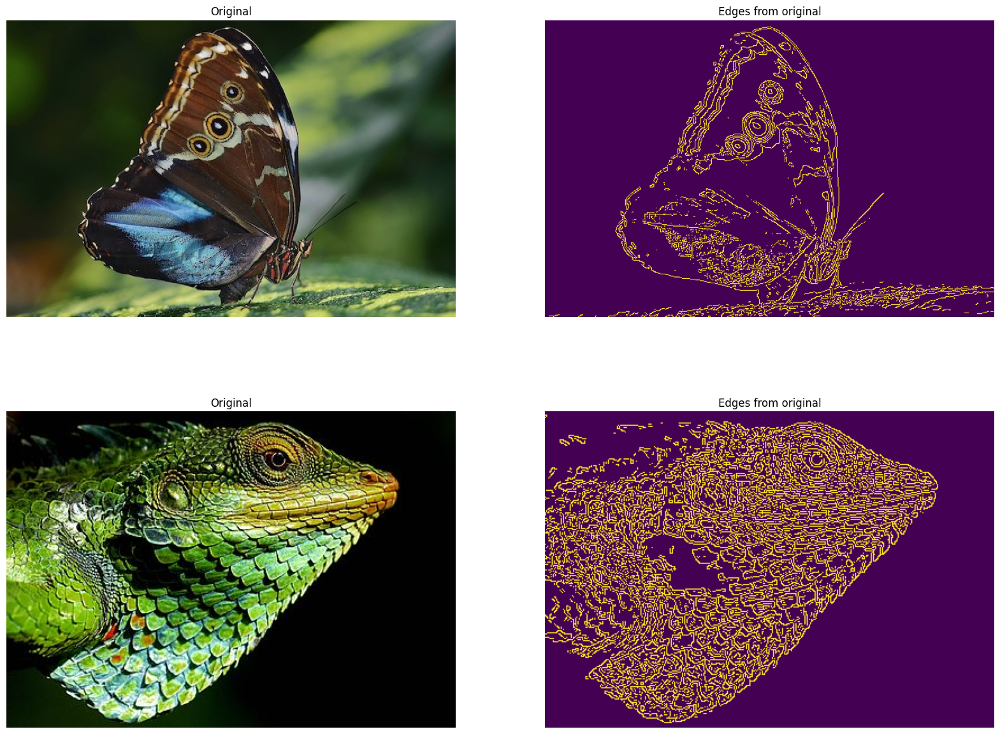

In [ ]:
# Canny Edge detection without blurring.
original_edges_1 = cv2.Canny(img1_gray, threshold1 = 180, threshold2 = 200)
original_edges_2 = cv2.Canny(img2_gray, threshold1 = 180, threshold2 = 200)

# Display.
plt.figure(figsize = (20,15))
plt.subplot(221); plt.axis('off'); plt.imshow(img1[:,:,::-1]);   plt.title('Original')
plt.subplot(222); plt.axis('off'); plt.imshow(original_edges_1); plt.title('Edges from original')

plt.subplot(223); plt.axis('off'); plt.imshow(img2[:,:,::-1]);   plt.title('Original')
plt.subplot(224); plt.axis('off'); plt.imshow(original_edges_2); plt.title('Edges from original');

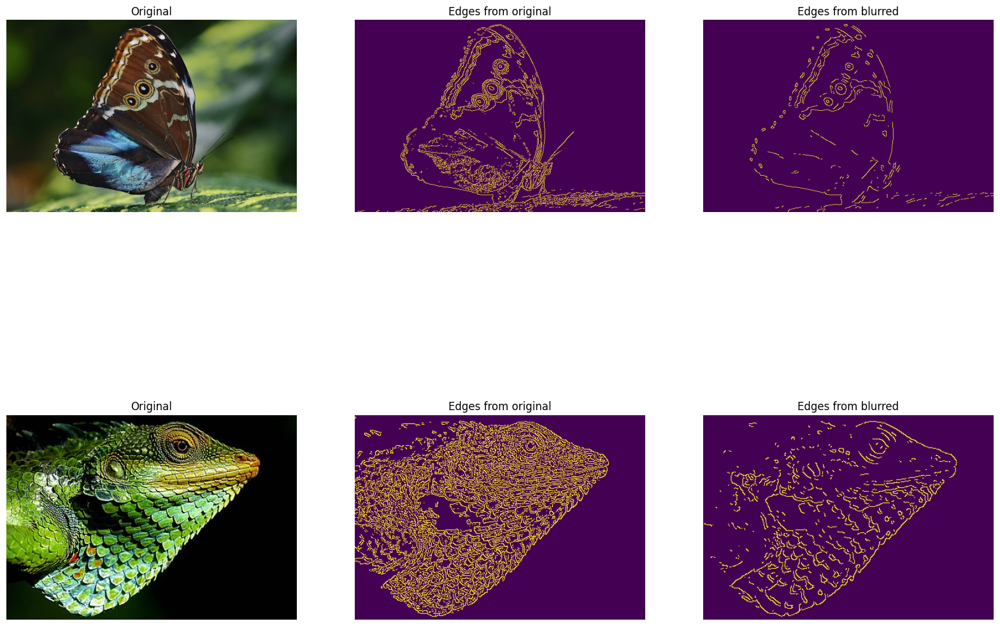

In [ ]:
# prompt: Perform edge detection using blurred images

# Apply Canny edge detection to the blurred images.
blurred_edges_1 = cv2.Canny(img1_blur, threshold1=180, threshold2=200)
blurred_edges_2 = cv2.Canny(img2_blur, threshold1=180, threshold2=200)

# Display the results.
plt.figure(figsize=(20, 15))
plt.subplot(231); plt.axis('off'); plt.imshow(img1[:, :, ::-1]); plt.title('Original')
plt.subplot(232); plt.axis('off'); plt.imshow(original_edges_1); plt.title('Edges from original')
plt.subplot(233); plt.axis('off'); plt.imshow(blurred_edges_1); plt.title('Edges from blurred')

plt.subplot(234); plt.axis('off'); plt.imshow(img2[:, :, ::-1]); plt.title('Original')
plt.subplot(235); plt.axis('off'); plt.imshow(original_edges_2); plt.title('Edges from original')
plt.subplot(236); plt.axis('off'); plt.imshow(blurred_edges_2); plt.title('Edges from blurred');

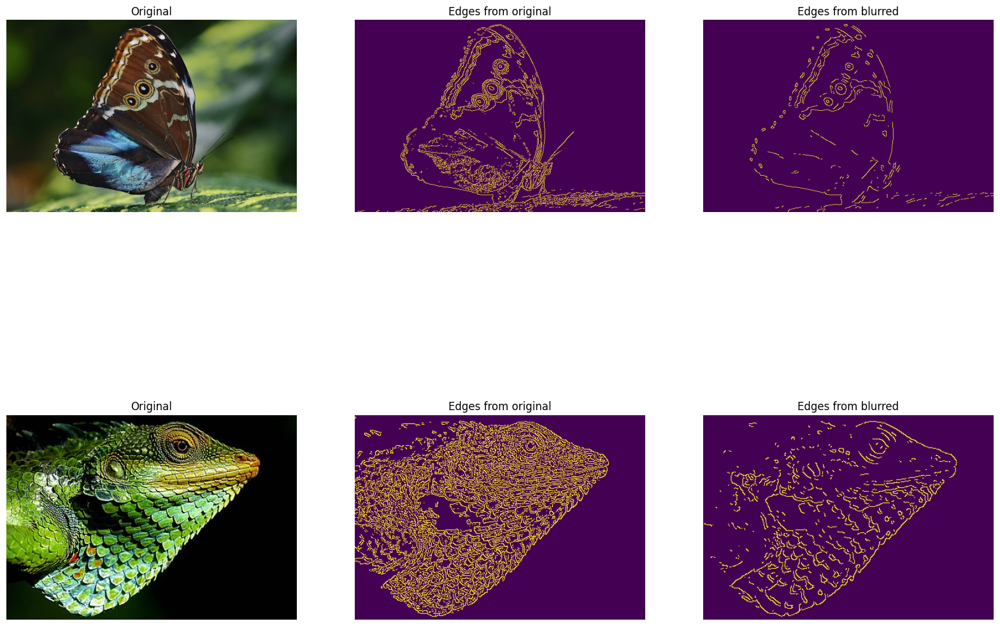

In [ ]:
# prompt: Perform edge detection using blurred images

# Apply Canny edge detection to the blurred images.
blurred_edges_1 = cv2.Canny(img1_blur, threshold1=180, threshold2=200)
blurred_edges_2 = cv2.Canny(img2_blur, threshold1=180, threshold2=200)

# Display the results.
plt.figure(figsize=(20, 15))
plt.subplot(231); plt.axis('off'); plt.imshow(img1[:, :, ::-1]); plt.title('Original')
plt.subplot(232); plt.axis('off'); plt.imshow(original_edges_1); plt.title('Edges from original')
plt.subplot(233); plt.axis('off'); plt.imshow(blurred_edges_1); plt.title('Edges from blurred')

plt.subplot(234); plt.axis('off'); plt.imshow(img2[:, :, ::-1]); plt.title('Original')
plt.subplot(235); plt.axis('off'); plt.imshow(original_edges_2); plt.title('Edges from original')
plt.subplot(236); plt.axis('off'); plt.imshow(blurred_edges_2); plt.title('Edges from blurred');

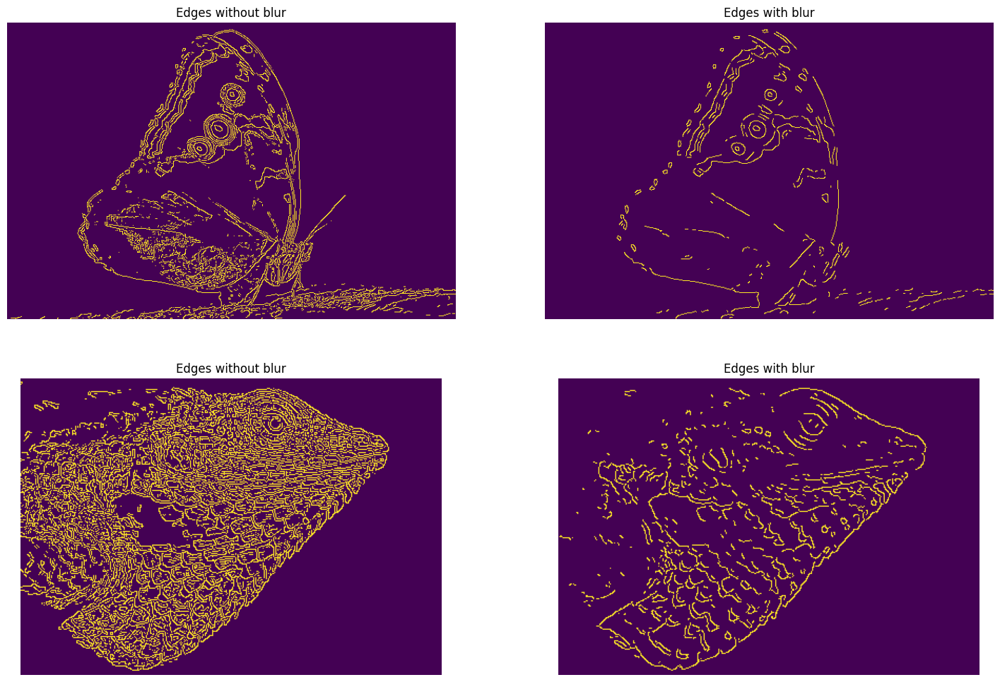

In [ ]:
blurred_edges_1 = cv2.Canny(img1_blur, threshold1 = 180, threshold2 = 200)
blurred_edges_2 = cv2.Canny(img2_blur, threshold1 = 180, threshold2 = 200)

# Display.
plt.figure(figsize = (18,12))
plt.subplot(221); plt.axis('off'); plt.imshow(original_edges_1); plt.title('Edges without blur')
plt.subplot(222); plt.axis('off'); plt.imshow(blurred_edges_1);  plt.title('Edges with blur')
plt.subplot(223); plt.axis('off'); plt.imshow(original_edges_2); plt.title('Edges without blur')
plt.subplot(224); plt.axis('off'); plt.imshow(blurred_edges_2);  plt.title('Edges with blur');

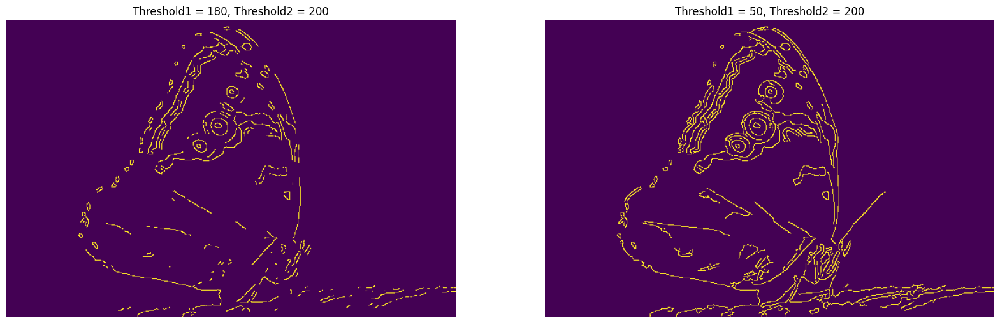

In [ ]:
# Edge detection with a high Threshold1 value.
blurred_edges_tight = cv2.Canny(img1_blur, threshold1 = 180, threshold2 = 200)
# Edge detection with a low Threshold1 value.
blurred_edges_open  = cv2.Canny(img1_blur, threshold1 = 50, threshold2 = 200)

plt.figure(figsize = (20,15))
plt.subplot(121); plt.axis('off'); plt.imshow(blurred_edges_tight); plt.title('Threshold1 = 180, Threshold2 = 200')
plt.subplot(122); plt.axis('off'); plt.imshow(blurred_edges_open);  plt.title('Threshold1 = 50, Threshold2 = 200');

In [ ]:
!pip install transformers torch torchvision requests Pillow

from transformers import ViTImageProcessor, ViTForImageClassification
import torch
import requests
from PIL import Image

# Load an image from URL
url = 'https://images.unsplash.com/photo-1516117172878-fd2c41f4a759'
image = Image.open(requests.get(url, stream=True).raw)

# Initialize the ViT model and processor
processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')

inputs = processor(images=image, return_tensors="pt")

# Predict
outputs = model(**inputs)
logits = outputs.logits

# Model predicts one of 1000 ImageNet classes
predicted_class_idx = logits.argmax(-1).item()
print("Predicted class:", model.config.id2label[predicted_class_idx])


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 28.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 922.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 78.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Predicted class: alp
